# Predicting Home Prices in Ames, Iowa


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import category_encoders as ce
import cufflinks as cf
import math
import plotly.express as px
from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from sklearn.preprocessing import LabelEncoder, OrdinalEncoder, OneHotEncoder
from sklearn.model_selection import train_test_split, cross_val_score, KFold, cross_validate
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor, HistGradientBoostingRegressor
from sklearn.compose import make_column_transformer, make_column_selector, ColumnTransformer
from sklearn.pipeline import make_pipeline, Pipeline
from scipy import stats
from scipy.stats import f_oneway, kruskal
init_notebook_mode(connected=True)
cf.go_offline()
%matplotlib inline

In [2]:
df= pd.read_csv("train.csv")

# Part 1: Examining the Data


We are examining the data to see if there are any issues or any feature engineering we might need to do. 

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [4]:
#df.fillna(0,inplace=True)

In [5]:
df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


We define a new variable called PricePerSF. In general, the bigger the house the more expensive it is because naturally a bigger house requires more materials. What might be easier and perhaps better to calculate is the price per square foot of the house instead. I plan to run the regression for both variables and see which one is the better predictor. 

In [6]:
df['PricePerSF']=df['SalePrice']/df['GrLivArea']

In [7]:
def catGraph(cat):
    print(df[cat].value_counts())
    fig=px.box(df, x=cat, y='SalePrice', title = 'Price By '+cat, points="all")
    fig.update_yaxes( 
        title_text = "Sale Price",
        title_standoff = 10)
    fig.update_xaxes(
        title_text = cat,
        title_standoff = 10)
    fig.show()    
    
    fig=px.box(df, x=cat, y='PricePerSF', title = 'Price By '+cat, points="all")
    fig.update_yaxes( 
        title_text = "Price Per SF",
        title_standoff = 10)
    fig.update_xaxes(
        title_text = cat,
        title_standoff = 10)
    fig.show()
    return 

def indicatorConversion(df, cat):
    df[cat]=np.where(df[cat]>0, 1, 0)
    df[cat]=df[cat].astype('object')
    return df

In [8]:
df.drop_duplicates(keep='first', inplace=True)

In [9]:
ord_col = [ 'LotShape', 'LandContour',  'LandSlope' ,'ExterQual', 'ExterCond',  'BsmtQual', 'BsmtCond', 'BsmtExposure',
           'BsmtFinType1', 'BsmtFinType2',  'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu',
            'GarageFinish', 'GarageQual','GarageCond', 'PavedDrive', 'PoolQC', 'Fence' ]
cat_col = ['MSSubClass', 'MSZoning', 'Neighborhood','Street', 'Alley', 'Utilities', 'LotConfig','Condition1', 'Condition2',  
          'BldgType', 'HouseStyle','RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd','MasVnrType','Foundation', 'Heating',
          'GarageType','MiscFeature','SaleType', 'SaleCondition'
         ]
cat_names = ['LotShape', 'LandContour',  'LandSlope' ,'ExterQual', 'ExterCond',  'BsmtQual', 'BsmtCond', 'BsmtExposure',
            'BsmtFinType1', 'BsmtFinType2',  'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu',
             'GarageFinish', 'GarageQual','GarageCond', 'PavedDrive', 'PoolQC', 'Fence','MSSubClass','MSZoning', 'Neighborhood','Street', 'Alley', 'Utilities', 'LotConfig','Condition1', 'Condition2',  
           'BldgType', 'HouseStyle','RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd','MasVnrType','Foundation', 'Heating',
           'GarageType','MiscFeature','SaleType', 'SaleCondition']

df[ord_col]=df[ord_col].astype("object")
df[cat_col]=df[cat_col].astype("category")

# Checking General Features of the Data

We first want to check what the distributions of the data looks like. We'll examine the counts in each class for the categorial variables, followed by the histograms for the numeric variables. 

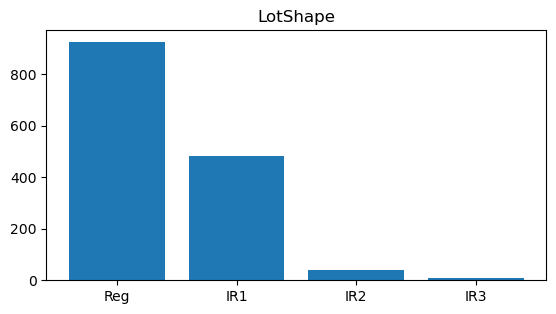

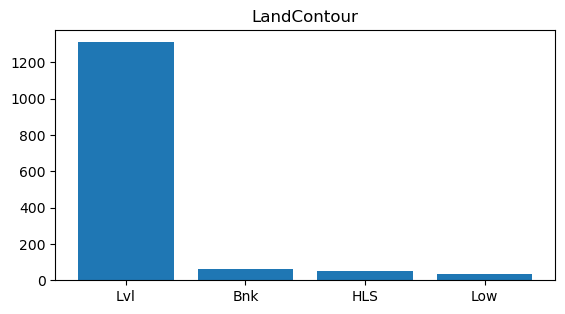

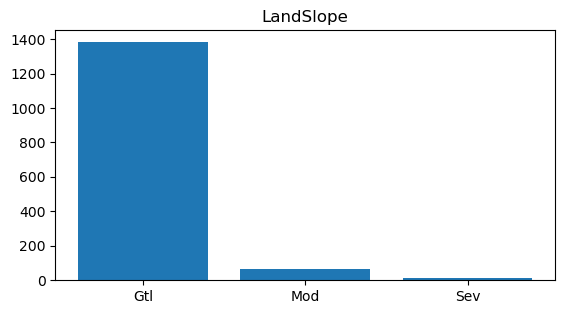

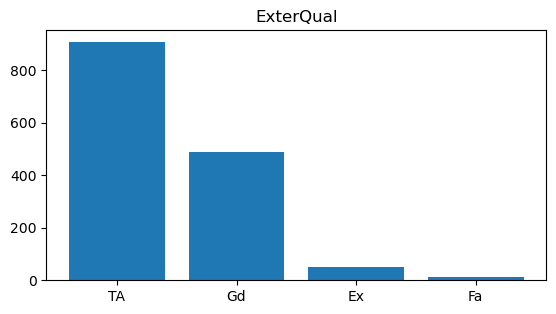

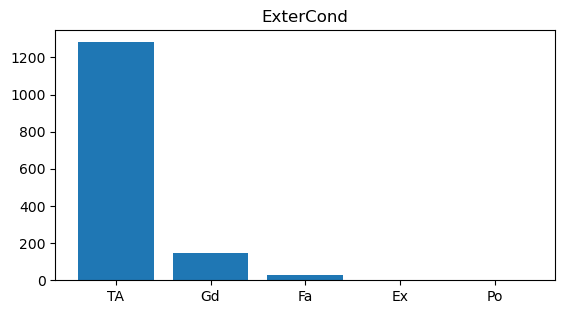

...

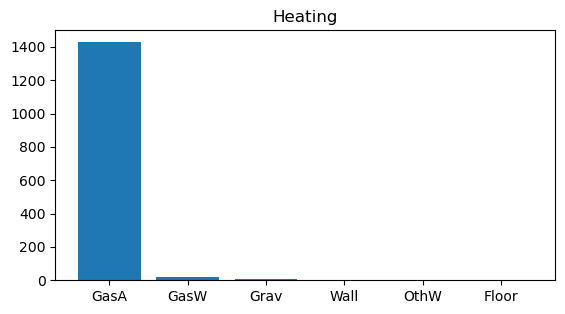

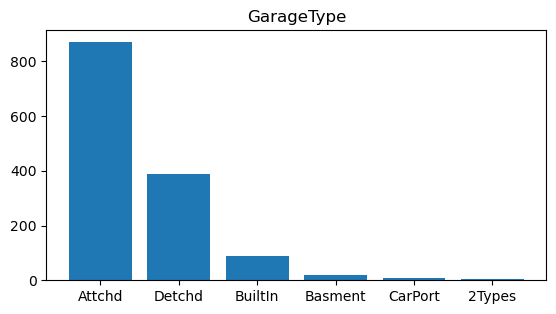

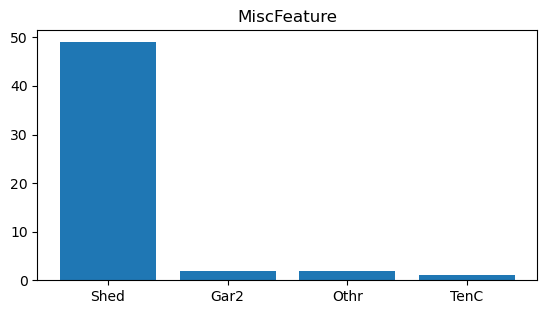

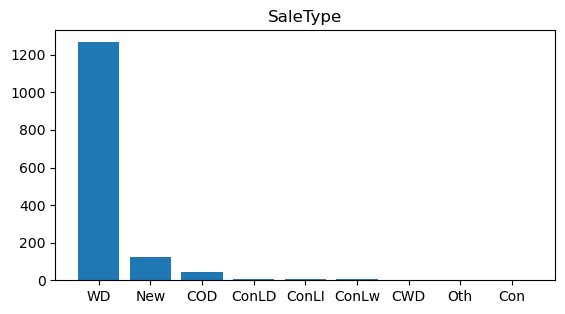

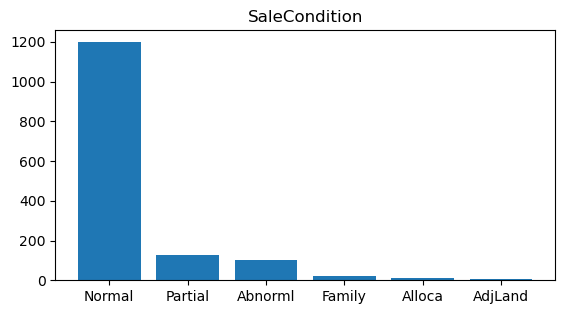

In [10]:
for cat in cat_names:
    fig = plt.figure()
    ax = fig.add_axes([0,0,1,1])
    ax.set_title(cat)
    fig.set_size_inches(5, 2.5, forward=True)
    ax.bar(df[cat].value_counts().index, df[cat].value_counts())
    plt.show()

There are several variables that are extremely skewed. We will probalby not bother with variables that only have 1 or 2 occurences in them of the secondary conditions(Street, Utilities, Condition2). Next let's examine the distribution for the numeric variables.

array([[<Axes: title={'center': 'Id'}>,
        <Axes: title={'center': 'LotFrontage'}>],
       [<Axes: title={'center': 'LotArea'}>,
        <Axes: title={'center': 'OverallQual'}>],
       [<Axes: title={'center': 'OverallCond'}>,
        <Axes: title={'center': 'YearBuilt'}>],
       [<Axes: title={'center': 'YearRemodAdd'}>,
        <Axes: title={'center': 'MasVnrArea'}>],
       [<Axes: title={'center': 'BsmtFinSF1'}>,
        <Axes: title={'center': 'BsmtFinSF2'}>],
       [<Axes: title={'center': 'BsmtUnfSF'}>,
        <Axes: title={'center': 'TotalBsmtSF'}>],
       [<Axes: title={'center': '1stFlrSF'}>,
        <Axes: title={'center': '2ndFlrSF'}>],
       [<Axes: title={'center': 'LowQualFinSF'}>,
        <Axes: title={'center': 'GrLivArea'}>],
       [<Axes: title={'center': 'BsmtFullBath'}>,
        <Axes: title={'center': 'BsmtHalfBath'}>],
       [<Axes: title={'center': 'FullBath'}>,
        <Axes: title={'center': 'HalfBath'}>],
       [<Axes: title={'center': 'Bedroom

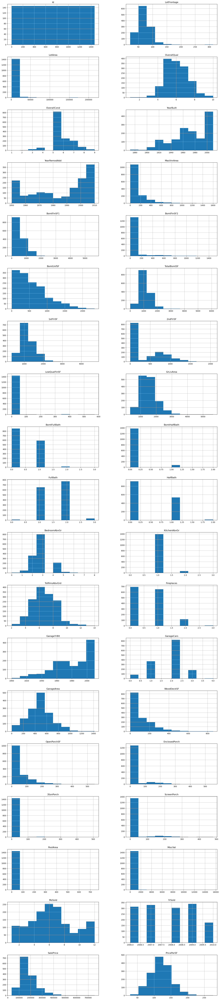

In [11]:
df.hist(layout= (20,2),figsize=(20,100))

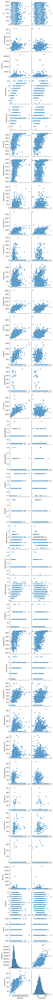

In [12]:
sns.pairplot(df, x_vars= ['SalePrice', 'PricePerSF'])

In [13]:
df2=df.copy(deep=True)
catCond=['ExterCond', 'BsmtCond', 'HeatingQC', 'Functional', 'GarageCond', 'ExterQual', 'FireplaceQu', 'GarageQual', 'KitchenQual']
catOverCond=['OverallCond', 'OverallQual']
catCondComb=catCond+catOverCond
df2['ExterCond'].replace(['Ex', 'Gd', 'TA', 'Fa', 'Po'], [5,4,3,2,1], inplace=True)
df2['BsmtCond'].replace(['Ex', 'Gd', 'TA', 'Fa', 'Po'], [5,4,3,2,1], inplace=True)
df2['HeatingQC'].replace(['Ex', 'Gd', 'TA', 'Fa', 'Po'], [5,4,3,2,1], inplace=True)
df2['Functional'].replace(['Typ', 'Min1', 'Min2', 'Mod', 'Maj1', 'Maj2', 'Sev', 'Sal'], [5,4.5,4,3,2,1.5,1,0], inplace=True)
df2['GarageCond'].replace(['Ex', 'Gd', 'TA', 'Fa', 'Po'], [5,4,3,2,1], inplace=True)
df2['ExterQual'].replace(['Ex', 'Gd', 'TA', 'Fa', 'Po'], [5,4,3,2,1], inplace=True)
df2['FireplaceQu'].replace(['Ex', 'Gd', 'TA', 'Fa', 'Po'], [5,4,3,2,1], inplace=True)
df2['GarageQual'].replace(['Ex', 'Gd', 'TA', 'Fa', 'Po'], [5,4,3,2,1], inplace=True)
df2['KitchenQual'].replace(['Ex', 'Gd', 'TA', 'Fa', 'Po'], [5,4,3,2,1], inplace=True)
df2['Alley'].replace(['Pave','Grvl',np.NaN],[2,1,0], inplace=True)
df2[catCond]=df2[catCond].astype("float")



In [14]:
for cat in cat_names:
    fig=px.box(df2, x=cat, y='SalePrice', title = 'Price By '+cat, points="all")
    fig.update_yaxes( 
        title_text = "Sale Price",
        title_standoff = 10)
    fig.update_xaxes(
        title_text = cat,
        title_standoff = 10)

    fig.show()

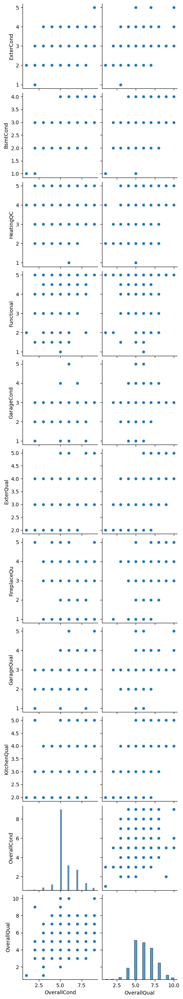

In [15]:
sns.pairplot(df2, x_vars=catOverCond, y_vars=catCondComb)

<Axes: >

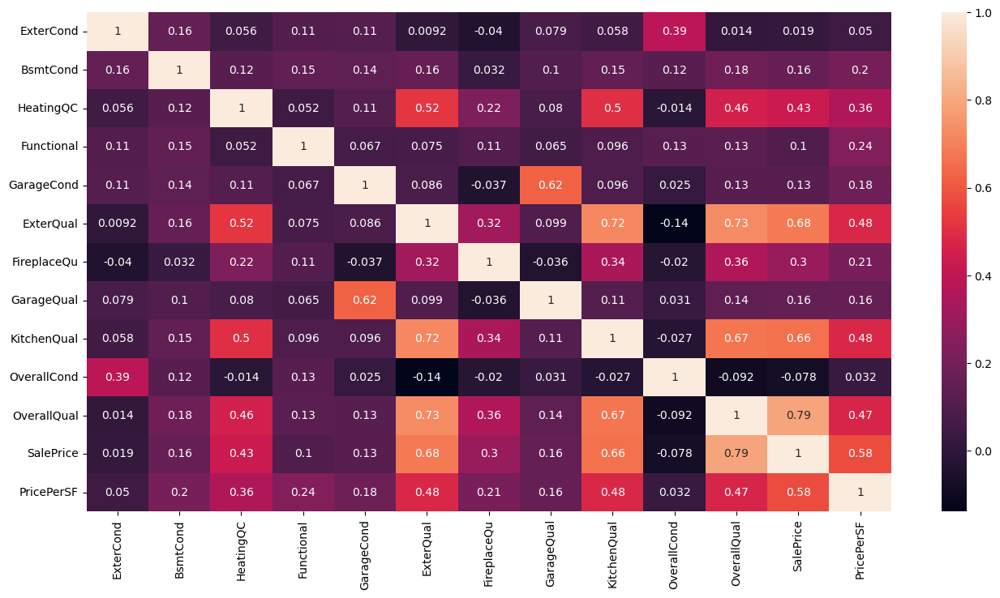

In [16]:
plt.figure(figsize = (16,8))
sns.heatmap(df2[catCondComb+['SalePrice', 'PricePerSF']].corr(), annot=True)

In [17]:
def r2(x, y):
    return stats.pearsonr(x, y)[0] ** 2

In [18]:
r2(df2['OverallQual'], df2['SalePrice'])

0.6256518924621178

<Axes: xlabel='OverallQual', ylabel='SalePrice'>

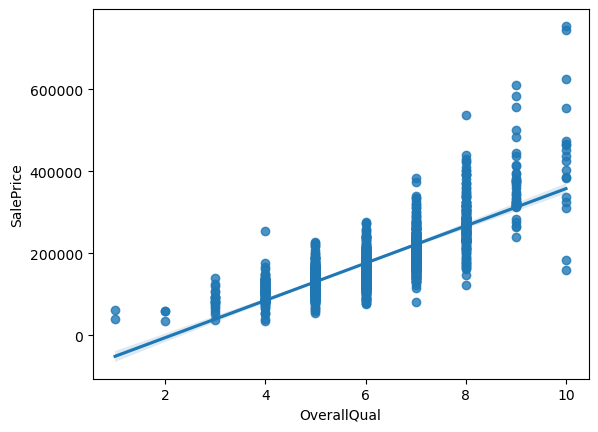

In [19]:
sns.regplot(data=df2, x='OverallQual', y='SalePrice', fit_reg=True)

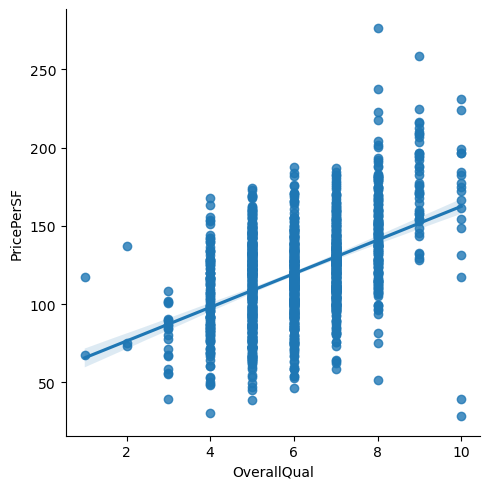

In [20]:
sns.lmplot(data=df2, x='OverallQual', y='PricePerSF')


# Part 2: Transforming and restructuring the data

There are several variables we may want to combine for ease of use as well as simplification of the model. Not every variable in the data set needs to be it's own separate variable. The first thing we want to look at is the general amount of outside living space. Instead of using each individual type of outdoor living space, we simply combine them into one variable. 

In [21]:
df['OutsideSF']=df['WoodDeckSF']+df['OpenPorchSF']+df['EnclosedPorch']+df['3SsnPorch']+df['ScreenPorch']

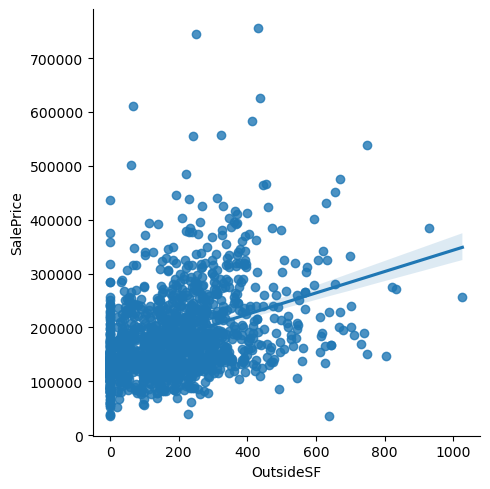

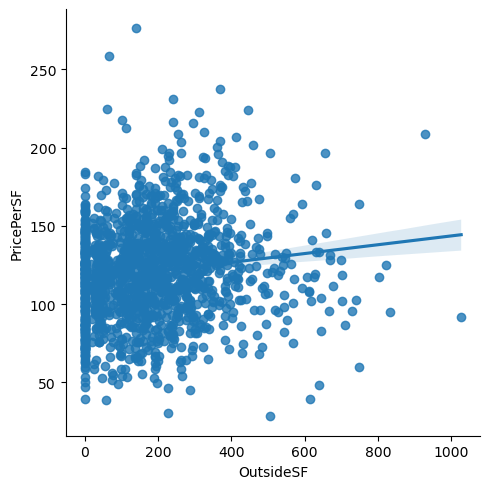

In [22]:
sns.lmplot(data=df, x='OutsideSF', y='SalePrice')
sns.lmplot(data=df, x='OutsideSF', y='PricePerSF')

In [23]:
df['OutsideSpace']=np.where(df['OutsideSF']>0, 1, 0)
df['OutsideSpace']=df['OutsideSpace'].astype('object')
catGraph('OutsideSpace')

1    1206
0     254
Name: OutsideSpace, dtype: int64


In [24]:
cat_names.append('OutsideSpace')

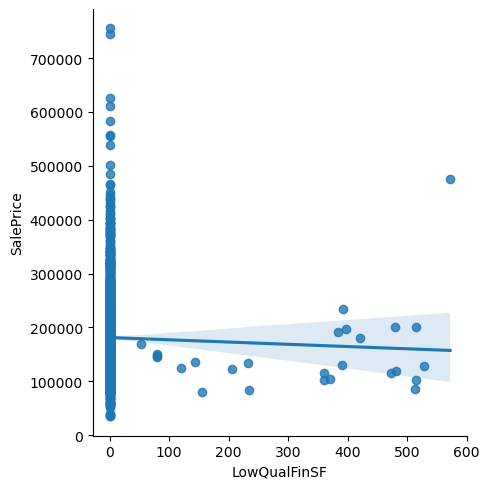

In [25]:
sns.lmplot(data=df, x='LowQualFinSF', y='SalePrice')

In [26]:
df['LowQualPerc']=df['LowQualFinSF']/df['GrLivArea']

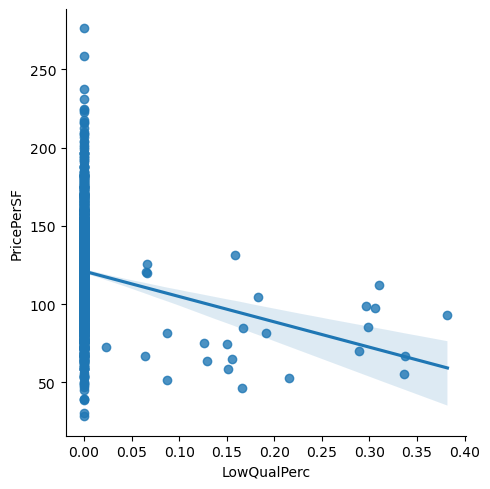

In [27]:
sns.lmplot(data=df, x='LowQualPerc', y='PricePerSF')

In [28]:
df['LowQualFin']=np.where(df['LowQualFinSF']>0, 1, 0).astype('object')
df['LowQualFin']=df['LowQualFin'].astype('object')
cat_names.append('LowQualFin')

In [29]:
catGraph('LowQualFin')

0    1434
1      26
Name: LowQualFin, dtype: int64


In [30]:
df['MiscFeatureBin']=np.where(pd.isna(df['MiscFeature']), 0, 1).astype('object')
df['MiscFeatureBin']=df['MiscFeatureBin'].astype('object')
cat_names.append('MiscFeatureBin')
catGraph('MiscFeatureBin')

0    1406
1      54
Name: MiscFeatureBin, dtype: int64


In [31]:
KPList=pd.DataFrame(columns=['CategoryName', 'KPValueSP', 'KPValuePPSF'])
for cat in cat_names:
    catGraph(cat)
    list1=[]
    list2=[]
    for names in df[cat].unique():
        if not pd.isna(names):
            list1.append(df['SalePrice'][df[cat]==names])
            list2.append(df['PricePerSF'][df[cat]==names])
    kPvalue1=kruskal(*list1)
    kPvalue2=kruskal(*list2)
    KPtemp=pd.DataFrame([[cat, kPvalue1[1], kPvalue2[1]]], columns=['CategoryName', 'KPValueSP', 'KPValuePPSF']) 
    KPList=pd.concat([KPList, KPtemp], ignore_index=True)  


Reg    925
IR1    484
IR2     41
IR3     10
Name: LotShape, dtype: int64


Lvl    1311
Bnk      63
HLS      50
Low      36
Name: LandContour, dtype: int64


Gtl    1382
Mod      65
Sev      13
Name: LandSlope, dtype: int64


TA    906
Gd    488
Ex     52
Fa     14
Name: ExterQual, dtype: int64


TA    1282
Gd     146
Fa      28
Ex       3
Po       1
Name: ExterCond, dtype: int64


TA    649
Gd    618
Ex    121
Fa     35
Name: BsmtQual, dtype: int64


TA    1311
Gd      65
Fa      45
Po       2
Name: BsmtCond, dtype: int64


No    953
Av    221
Gd    134
Mn    114
Name: BsmtExposure, dtype: int64


Unf    430
GLQ    418
ALQ    220
BLQ    148
Rec    133
LwQ     74
Name: BsmtFinType1, dtype: int64


Unf    1256
Rec      54
LwQ      46
BLQ      33
ALQ      19
GLQ      14
Name: BsmtFinType2, dtype: int64


Ex    741
TA    428
Gd    241
Fa     49
Po      1
Name: HeatingQC, dtype: int64


Y    1365
N      95
Name: CentralAir, dtype: int64


SBrkr    1334
FuseA      94
FuseF      27
FuseP       3
Mix         1
Name: Electrical, dtype: int64


TA    735
Gd    586
Ex    100
Fa     39
Name: KitchenQual, dtype: int64


Typ     1360
Min2      34
Min1      31
Mod       15
Maj1      14
Maj2       5
Sev        1
Name: Functional, dtype: int64


Gd    380
TA    313
Fa     33
Ex     24
Po     20
Name: FireplaceQu, dtype: int64


Unf    605
RFn    422
Fin    352
Name: GarageFinish, dtype: int64


TA    1311
Fa      48
Gd      14
Ex       3
Po       3
Name: GarageQual, dtype: int64


TA    1326
Fa      35
Gd       9
Po       7
Ex       2
Name: GarageCond, dtype: int64


Y    1340
N      90
P      30
Name: PavedDrive, dtype: int64


Gd    3
Ex    2
Fa    2
Name: PoolQC, dtype: int64


MnPrv    157
GdPrv     59
GdWo      54
MnWw      11
Name: Fence, dtype: int64


20     536
60     299
50     144
120     87
30      69
160     63
70      60
80      58
90      52
190     30
85      20
75      16
45      12
180     10
40       4
Name: MSSubClass, dtype: int64


RL         1151
RM          218
FV           65
RH           16
C (all)      10
Name: MSZoning, dtype: int64


NAmes      225
CollgCr    150
OldTown    113
Edwards    100
Somerst     86
Gilbert     79
NridgHt     77
Sawyer      74
NWAmes      73
SawyerW     59
BrkSide     58
Crawfor     51
Mitchel     49
NoRidge     41
Timber      38
IDOTRR      37
ClearCr     28
StoneBr     25
SWISU       25
Blmngtn     17
MeadowV     17
BrDale      16
Veenker     11
NPkVill      9
Blueste      2
Name: Neighborhood, dtype: int64


Pave    1454
Grvl       6
Name: Street, dtype: int64


Grvl    50
Pave    41
Name: Alley, dtype: int64


AllPub    1459
NoSeWa       1
Name: Utilities, dtype: int64


Inside     1052
Corner      263
CulDSac      94
FR2          47
FR3           4
Name: LotConfig, dtype: int64


Norm      1260
Feedr       81
Artery      48
RRAn        26
PosN        19
RRAe        11
PosA         8
RRNn         5
RRNe         2
Name: Condition1, dtype: int64


Norm      1445
Feedr        6
Artery       2
PosN         2
RRNn         2
PosA         1
RRAe         1
RRAn         1
Name: Condition2, dtype: int64


1Fam      1220
TwnhsE     114
Duplex      52
Twnhs       43
2fmCon      31
Name: BldgType, dtype: int64


1Story    726
2Story    445
1.5Fin    154
SLvl       65
SFoyer     37
1.5Unf     14
2.5Unf     11
2.5Fin      8
Name: HouseStyle, dtype: int64


Gable      1141
Hip         286
Flat         13
Gambrel      11
Mansard       7
Shed          2
Name: RoofStyle, dtype: int64


CompShg    1434
Tar&Grv      11
WdShngl       6
WdShake       5
ClyTile       1
Membran       1
Metal         1
Roll          1
Name: RoofMatl, dtype: int64


VinylSd    515
HdBoard    222
MetalSd    220
Wd Sdng    206
Plywood    108
CemntBd     61
BrkFace     50
WdShing     26
Stucco      25
AsbShng     20
BrkComm      2
Stone        2
AsphShn      1
CBlock       1
ImStucc      1
Name: Exterior1st, dtype: int64


VinylSd    504
MetalSd    214
HdBoard    207
Wd Sdng    197
Plywood    142
CmentBd     60
Wd Shng     38
Stucco      26
BrkFace     25
AsbShng     20
ImStucc     10
Brk Cmn      7
Stone        5
AsphShn      3
CBlock       1
Other        1
Name: Exterior2nd, dtype: int64


None       864
BrkFace    445
Stone      128
BrkCmn      15
Name: MasVnrType, dtype: int64


PConc     647
CBlock    634
BrkTil    146
Slab       24
Stone       6
Wood        3
Name: Foundation, dtype: int64


GasA     1428
GasW       18
Grav        7
Wall        4
OthW        2
Floor       1
Name: Heating, dtype: int64


Attchd     870
Detchd     387
BuiltIn     88
Basment     19
CarPort      9
2Types       6
Name: GarageType, dtype: int64


Shed    49
Gar2     2
Othr     2
TenC     1
Name: MiscFeature, dtype: int64


WD       1267
New       122
COD        43
ConLD       9
ConLI       5
ConLw       5
CWD         4
Oth         3
Con         2
Name: SaleType, dtype: int64


Normal     1198
Partial     125
Abnorml     101
Family       20
Alloca       12
AdjLand       4
Name: SaleCondition, dtype: int64


1    1206
0     254
Name: OutsideSpace, dtype: int64


0    1434
1      26
Name: LowQualFin, dtype: int64


0    1406
1      54
Name: MiscFeatureBin, dtype: int64


In [32]:
KPList

,CategoryName,KPValueSP,KPValuePPSF
0,LotShape,1.640323e-32,7.702356e-12
1,LandContour,1.047923e-07,1.797468e-12
2,LandSlope,1.395380e-01,9.245630e-01
3,ExterQual,8.180798e-148,6.454620e-64
4,ExterCond,1.832365e-09,1.000011e-08
5,BsmtQual,1.265030e-136,5.729360e-72
6,BsmtCond,2.072696e-13,1.232487e-16
7,BsmtExposure,6.343558e-30,2.503587e-47
8,BsmtFinType1,2.413404e-62,3.585114e-63
9,BsmtFinType2,5.027077e-02,2.480333e-01


Home availability tends to follow a cyclical cycle with more people moving in the summer months and fewer in the winter months. We want to see if home pricing follows a similar trend in our data.

In [33]:
groupByMon=df.groupby(['YrSold', 'MoSold']).agg({'SalePrice': ['mean','median','min','max','count']})
groupByMon.columns=['SalePrice_mean','SalePrice_median', 'SalePrice_min', 'SalePrice_max', 'count']
groupByMon=groupByMon.reset_index()

In [34]:
groupByMon.columns=['year','month','SalePrice_mean','SalePrice_median', 'SalePrice_min', 'SalePrice_max','count']

In [35]:
groupByMon['date']=pd.to_datetime(groupByMon[['year','month']].assign(Day=1))

<Axes: xlabel='date', ylabel='value'>

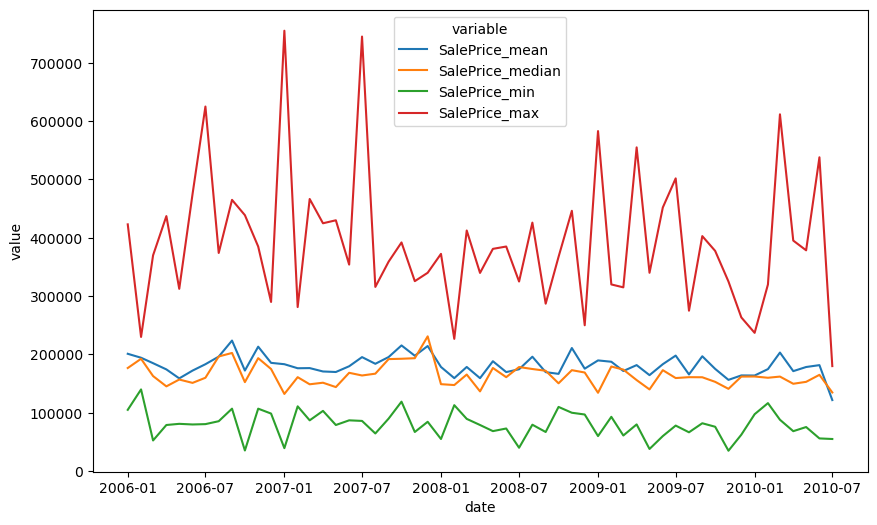

In [36]:
plt.subplots(figsize=(10,6))
sns.lineplot(data=pd.melt(groupByMon[['date','SalePrice_mean','SalePrice_median', 'SalePrice_min', 'SalePrice_max'
                                     ]], ['date']), x ='date', y='value', hue='variable')

There's noclear cyclical trend in the sales prices observed, instead we see a mostly flat trend line for the mean and median prices. We want to verify our understanding that at least the number of homes available for sale is cyclic and follows the trend we expect. 

<Axes: xlabel='date', ylabel='count'>

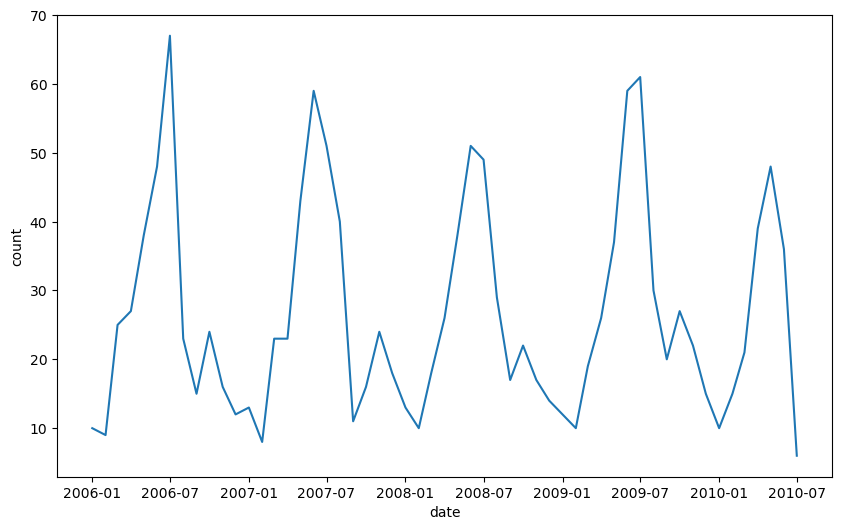

In [37]:
plt.subplots(figsize=(10,6))
sns.lineplot(data=groupByMon, x ='date', y='count')

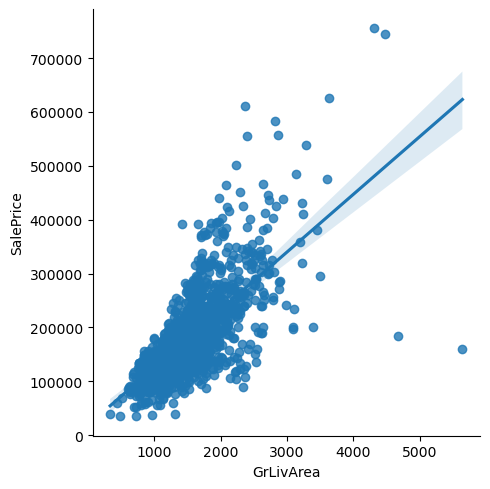

In [38]:
sns.lmplot(data=df, x='GrLivArea', y='SalePrice')

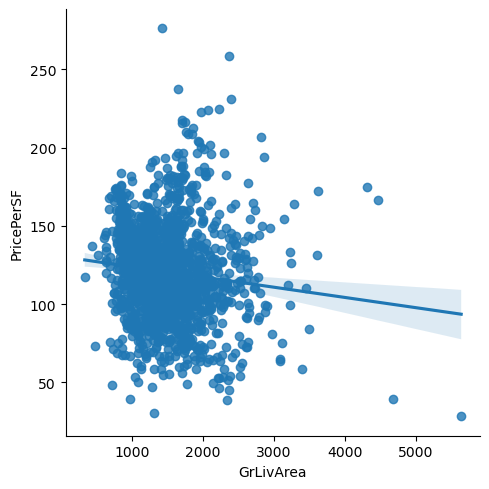

In [39]:
sns.lmplot(data=df, x='GrLivArea', y='PricePerSF')

In [40]:
df3=df.drop(columns=['Alley','Condition2', '1stFlrSF','2ndFlrSF', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'Fence','Street',  
        'PoolQC', 'Utilities', 'LandSlope','LowQualPerc','LowQualFinSF'])

In [41]:
X=df3.drop(['SalePrice','PricePerSF'], axis = 1)
y1=df['PricePerSF']
y2=df['SalePrice']

X_train, X_test, y1_train, y1_test = train_test_split(X,y1, test_size =0.3, random_state=42)
X2_train, X2_test, y2_train, y2_test = train_test_split(X,y2, test_size =0.3, random_state=42)

In [42]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1022 entries, 135 to 1126
Data columns (total 69 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   Id              1022 non-null   int64   
 1   MSSubClass      1022 non-null   category
 2   MSZoning        1022 non-null   category
 3   LotFrontage     832 non-null    float64 
 4   LotArea         1022 non-null   int64   
 5   LotShape        1022 non-null   object  
 6   LandContour     1022 non-null   object  
 7   LotConfig       1022 non-null   category
 8   Neighborhood    1022 non-null   category
 9   Condition1      1022 non-null   category
 10  BldgType        1022 non-null   category
 11  HouseStyle      1022 non-null   category
 12  OverallQual     1022 non-null   int64   
 13  OverallCond     1022 non-null   int64   
 14  YearBuilt       1022 non-null   int64   
 15  YearRemodAdd    1022 non-null   int64   
 16  RoofStyle       1022 non-null   category
 17  RoofMatl    

In [43]:
categorical_columns2=X_train.select_dtypes(include={ 'category'}).columns

In [44]:
preprocessor=make_column_transformer(
    (
        OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1),
        make_column_selector(dtype_include='object')
    ),
   (
        OneHotEncoder(handle_unknown='ignore'),
        categorical_columns2
    ),
    remainder="passthrough",
    verbose_feature_names_out=True,
        
)


In [45]:
hist_native = make_pipeline(
    preprocessor,
    HistGradientBoostingRegressor(
        random_state=42,
        categorical_features=range(preprocessor.fit(X_train).output_indices_['ordinalencoder'].stop)
    ),
)

In [46]:
cross_validate(hist_native, X_train, y1_train, cv=5, scoring="neg_mean_absolute_percentage_error")

{'fit_time': array([4.19386268, 3.70108366, 3.7830689 , 3.77090454, 3.90244651]),
 'score_time': array([0.01202273, 0.01000237, 0.01100016, 0.01300693, 0.03650999]),
 'test_score': array([-0.08540333, -0.14382078, -0.1008341 , -0.09650031, -0.08312547])}

In [47]:
cross_validate(hist_native, X2_train, y2_train, cv=5, scoring="neg_mean_absolute_percentage_error")

{'fit_time': array([3.57010889, 3.33754992, 3.58724809, 3.40772557, 3.48835039]),
 'score_time': array([0.01100087, 0.01099968, 0.00999999, 0.0100019 , 0.01000428]),
 'test_score': array([-0.10171467, -0.12407501, -0.10289999, -0.09522499, -0.08496745])}

In [48]:
hist_native.fit(X_train,y1_train)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ordinalencoder',
                                                  OrdinalEncoder(handle_unknown='use_encoded_value',
                                                                 unknown_value=-1),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x000002449758C160>),
                                                 ('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  Index(['MSSubClass', 'MSZoning', 'LotConfig', 'Neighborhood', 'Condition1',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'Foundation', 'Heating', 'GarageType',
       'MiscFeature', 'SaleType', 'SaleCondition'],
      dtype='object'))])),
                ('histgradientboostingregressor',
                 HistGradientBoostingRegressor(categorical_features=range(0, 22),
                                               random_state=42))])

In [49]:
X_results=hist_native.predict(X_test)

In [50]:
np.log(X_results*X_test['GrLivArea'])

892     11.881293
1105    12.754765
413     11.596968
522     11.976464
1036    12.692636
          ...    
331     11.796836
323     11.860942
650     12.224169
439     11.630170
798     13.114776
Name: GrLivArea, Length: 438, dtype: float64

In [51]:
def logSaleprice(pricePerSF, df):
    return np.log(pricePerSF*df['GrLivArea'])
    

In [52]:
X_results=logSaleprice(X_results, X_test)

In [53]:
math.sqrt(mean_squared_error(X_results,np.log(y2_test)))

0.13200401488831864

In [54]:
hist_native.fit(X2_train,y2_train)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ordinalencoder',
                                                  OrdinalEncoder(handle_unknown='use_encoded_value',
                                                                 unknown_value=-1),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x000002449758C160>),
                                                 ('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  Index(['MSSubClass', 'MSZoning', 'LotConfig', 'Neighborhood', 'Condition1',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'Foundation', 'Heating', 'GarageType',
       'MiscFeature', 'SaleType', 'SaleCondition'],
      dtype='object'))])),
                ('histgradientboostingregressor',
                 HistGradientBoostingRegressor(categorical_features=range(0, 22),
                                               random_state=42))])

In [55]:
X2_results=hist_native.predict(X2_test)

In [56]:
math.sqrt(mean_squared_error(np.log(X2_results),np.log(y2_test)))


0.13766867831912372

In [57]:
dftest= pd.read_csv("test.csv")

In [58]:
def procData(df):
    cat_col = ['MSSubClass', 'MSZoning', 'Neighborhood','Street', 'Alley', 'Utilities', 'LotConfig','Condition1', 'Condition2',  
          'BldgType', 'HouseStyle','RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd','MasVnrType','Foundation', 'Heating',
          'GarageType','MiscFeature','SaleType', 'SaleCondition'
         ]
    df[cat_col]=df[cat_col].astype("category")
    df['OutsideSF']=df['WoodDeckSF']+df['OpenPorchSF']+df['EnclosedPorch']+df['3SsnPorch']+df['ScreenPorch']
    df['OutsideSpace']=np.where(df['OutsideSF']>0,1,0)
    df['LowQualFin']=np.where(df['LowQualFinSF']>0,1,0)
    df['MiscFeatureBin']=np.where(pd.isna(df['MiscFeature']), 0, 1)
    df[['OutsideSpace','LowQualFin','MiscFeatureBin']]=df[['OutsideSpace','LowQualFin','MiscFeatureBin']].astype('object')
    
    IdColumn=df['Id']
    df=df.drop(columns=['Alley','Condition2', '1stFlrSF','2ndFlrSF', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'Fence','Street',  
        'PoolQC', 'Utilities', 'LandSlope','LowQualFinSF'])
    return IdColumn, df
    

In [59]:
Idcol, dftest = procData(dftest)

In [60]:
Idcol

0       1461
1       1462
2       1463
3       1464
4       1465
        ... 
1454    2915
1455    2916
1456    2917
1457    2918
1458    2919
Name: Id, Length: 1459, dtype: int64

In [61]:
test_results=pd.Series(hist_native.predict(dftest))

In [62]:
test_results

0       133708.614232
1       148117.775650
2       183559.926308
3       187823.269642
4       202375.330540
            ...      
1454     79952.123897
1455     87608.808552
1456    167477.539559
1457    123809.493568
1458    218000.290668
Length: 1459, dtype: float64

In [63]:
final_result=pd.concat((Idcol,test_results), axis = 1)

In [64]:
final_result.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1459 entries, 0 to 1458
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Id      1459 non-null   int64  
 1   0       1459 non-null   float64
dtypes: float64(1), int64(1)
memory usage: 22.9 KB


In [65]:
final_result.rename(columns={0:'SalePrice'},inplace= True)

In [66]:
final_result.to_csv('final_result.csv', index=False)